# D-Fire · Barrido inicial de umbrales y revisión de errores

**Fase 05 del TFM — selección exploratoria en validación.**

Este cuaderno continúa la comparación del notebook 03. Presenta resultados
guardados, candidatos bajo distintas tasas de falsas alarmas y errores que
orientan los siguientes entrenamientos. Arranca en modo consulta: no entrena,
no hace inferencia y no evalúa test al ejecutar sus celdas con los valores por defecto.

## Guía de lectura y ejecución

| Aspecto | Descripción |
|---|---|
| **Papel en el proyecto** | Núcleo analítico: compara umbrales por clase y el coste en falsas alarmas. |
| **Cuándo abrirlo** | Abrir para seguir cómo se pasa de las métricas generales a puntos operativos candidatos. |
| **Comportamiento por defecto** | Solo consulta por defecto (`RUN_SWEEP=False`); reutiliza la última ejecución verificada. |
| **Entradas principales** | Predicciones de validación de los modelos finalistas y `configs/threshold_sweep.yaml`. |
| **Salidas principales** | `artifacts/05_threshold_sweep/validation/<run_id>` con tablas, figuras y revisión de errores. |
| **Continuación** | `06_DFire_comparacion_resolucion.ipynb`. |

> **Entorno:** abrir desde la raíz del repositorio o definir
> `TFM_PROJECT_ROOT`. La reproducción completa de entrenamientos necesita el
> dataset D-Fire y una GPU; la lectura de resultados guardados no.


## 1. Contexto y método

La pregunta es **qué recall de humo y fuego ofrece cada modelo para una tasa
comparable de alarmas en imágenes negativas**.

- Se utilizan YOLOv8s, YOLO26s y YOLO26n con sus `best.pt`, dataset y semilla originales.
- Una inferencia por modelo a confianza **0,01** guarda todas las cajas retenidas.
- El barrido filtra las cajas y vuelve a emparejarlas con las anotaciones: misma clase,
  confianza descendente, IoU ≥0,50 y una sola coincidencia por caja real.
- Se conserva el preprocesado del análisis operativo: 640, `rect=False`, FP32 y lotes de 4.
  YOLOv8 usa NMS IoU 0,70; las ejecuciones YOLO26 registradas usan cabeza end-to-end.
- El punto **0,25 debe reproducir los TP/FP/FN de cada imagen** de la inferencia histórica.

**Supuestos y límites.** Las etiquetas corregidas constituyen la referencia; las escenas
relacionadas entre particiones y una única semilla limitan las conclusiones. Este barrido
selecciona filtros de confianza, no calibra probabilidades ni vuelve a calcular mAP.
Los candidatos son exploratorios: el test final y la elección de despliegue quedan pendientes.

### 1.1 Parámetros y entorno

In [1]:
from pathlib import Path
import os
import sys
import json
import pandas as pd
import numpy as np
from IPython.display import display, Markdown, Image

roots = [Path(os.environ["TFM_PROJECT_ROOT"])] if os.environ.get("TFM_PROJECT_ROOT") else []
roots += [Path.cwd(), *Path.cwd().parents]
PROJECT_ROOT = next((p for p in roots if (p / "tfm_pipeline.py").is_file()), None)
if PROJECT_ROOT is None:
    raise FileNotFoundError("Abrir el notebook dentro de la carpeta TFM o definir TFM_PROJECT_ROOT.")
if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))
import tfm_pipeline as pipeline
from tfm_thresholds import MODEL_LABELS

CONFIG_PATH = PROJECT_ROOT / "configs" / "threshold_sweep.yaml"
RUN_SWEEP = False
OFFLINE = True  # Al generar un barrido: exige predicciones guardadas.
RUN_ID = None   # None lee la última ejecución completa; se puede fijar su identificador.


Para crear una nueva ejecución, cambiar `RUN_SWEEP=True`. Si faltan predicciones
para esa configuración, usar también `OFFLINE=False` dentro del contenedor con GPU.
Las inferencias se guardan separadas de la evaluación histórica a 0,25 y se reutilizan
solo cuando coinciden pesos, manifiesto, código de inferencia, parámetros y versiones.

In [2]:
result_parent = PROJECT_ROOT / "artifacts" / "05_threshold_sweep" / "validation"
if RUN_SWEEP:
    from tools.run_threshold_sweep import run
    RESULT_DIR = run(CONFIG_PATH, offline=OFFLINE)
elif RUN_ID:
    if Path(RUN_ID).name != RUN_ID:
        raise ValueError("RUN_ID debe ser un identificador de ejecución, no una ruta.")
    RESULT_DIR = result_parent / RUN_ID
else:
    latest = pipeline.read_json(result_parent / "latest.json")
    RESULT_DIR = PROJECT_ROOT / latest["run_rel"]
    if pipeline.sha256_file(RESULT_DIR / "run_summary.json") != latest["summary_sha256"]:
        raise ValueError("El resumen no coincide con el índice de resultados.")
summary = pipeline.read_json(RESULT_DIR / "run_summary.json")
if summary["status"] != "complete" or summary["split"] != "val":
    raise ValueError("Se necesita una ejecución completa de validación.")
for relative, expected_hash in summary["output_hashes"].items():
    if pipeline.sha256_file(RESULT_DIR / relative) != expected_hash:
        raise ValueError(f"Artefacto modificado: {relative}")
metrics = pd.read_csv(RESULT_DIR / "threshold_metrics.csv")
candidates = pd.read_csv(RESULT_DIR / "scenario_candidates.csv")
sizes = pd.read_csv(RESULT_DIR / "size_metrics.csv")
ground_truth = pd.read_csv(RESULT_DIR / "ground_truth_review.csv")
detections = pd.read_csv(RESULT_DIR / "detection_review.csv")
print(f"Ejecución: {summary['run_id']} · dataset: {summary['dataset_version']} · partición: val")
print(f"Resultados: {RESULT_DIR}")


Ejecución: 20260911T201435Z_0a767584 · dataset: dfire_seed42_val10_v1 · partición: val
Resultados: /workspace/TFM/artifacts/05_threshold_sweep/validation/20260911T201435Z_0a767584


## 2. Resumen de los resultados observados

In [3]:
scenario = f"alarm_{round(summary['config']['review_budget'] * 100):02d}pct"
selected = candidates[(candidates.scenario == scenario) & candidates.feasible]
sentences = ["**Escenario diagnóstico: hasta el 2 % de negativas con alarma.**"]
for row in selected.itertuples():
    sentences.append(f"- **{MODEL_LABELS[row.model_key]}**, confianza **{row.threshold:.2f}**: "
                     f"recall humo **{row.smoke_recall:.1%}**, fuego **{row.fire_recall:.1%}**; "
                     f"{int(row.negative_images_with_alarm)}/783 negativas con alarma ({row.negative_alarm_rate:.2%}).")
sentences.append("Estos candidatos maximizan el recall medio de ambas clases dentro del límite y la malla evaluada. "
                 "El 2 % es un escenario ilustrativo, no una decisión de despliegue.")
display(Markdown("\n\n".join(sentences)))


**Escenario diagnóstico: hasta el 2 % de negativas con alarma.**

- **YOLOv8s**, confianza **0.30**: recall humo **82.1%**, fuego **70.5%**; 13/783 negativas con alarma (1.66%).

- **YOLO26s**, confianza **0.15**: recall humo **85.2%**, fuego **76.3%**; 8/783 negativas con alarma (1.02%).

- **YOLO26n**, confianza **0.15**: recall humo **82.4%**, fuego **73.9%**; 10/783 negativas con alarma (1.28%).

Estos candidatos maximizan el recall medio de ambas clases dentro del límite y la malla evaluada. El 2 % es un escenario ilustrativo, no una decisión de despliegue.

### 2.1 Población y comprobaciones

In [4]:
coverage = pd.DataFrame([
    {"Modelo": MODEL_LABELS[model], "Imágenes": summary["images_per_model"],
     "Negativas": summary["negative_images"], "Umbrales": len(summary["config"]["thresholds"]),
     "Referencia 0,25": check["status"]}
    for model, check in summary["baseline_verification"].items()
])
display(coverage)
print("GT: 960 cajas de humo y 1.155 de fuego. Cada imagen negativa carece de ambas clases.")
print("Referencia 0,25 reconciliada por imagen, clase y TP/FP/FN; pesos y manifiesto verificados por SHA-256.")


,Modelo,Imágenes,Negativas,Umbrales,"Referencia 0,25"
0,YOLOv8s,1721,783,21,passed
1,YOLO26s,1721,783,21,passed
2,YOLO26n,1721,783,21,passed


GT: 960 cajas de humo y 1.155 de fuego. Cada imagen negativa carece de ambas clases.
Referencia 0,25 reconciliada por imagen, clase y TP/FP/FN; pesos y manifiesto verificados por SHA-256.


## 3. Comparación de umbrales

### 3.1 Recall, F1 y alarmas

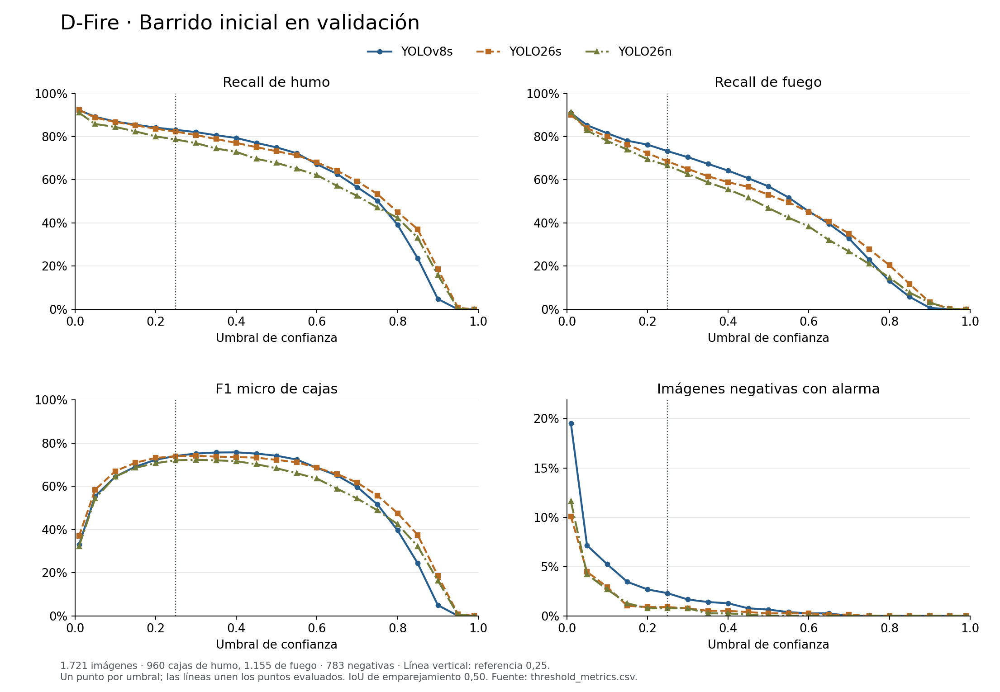

In [5]:
display(Image(filename=str(RESULT_DIR / "figures" / "01_threshold_curves.png"), width=1100))


Bajar el umbral permite recuperar detecciones de menor puntuación, a cambio de
admitir más cajas falsas. La referencia vertical de 0,25 permite conectar estos resultados
con el notebook 03. F1 micro suma TP, FP y FN de ambas clases antes de calcular la razón;
el recall macro da el mismo peso a humo y fuego.

### 3.2 Referencia y máximo F1 de la malla

In [6]:
def present_table(table, columns):
    names = {
        "model_key": "Modelo", "scenario": "Escenario", "threshold": "Confianza",
        "smoke_recall": "Recall humo", "fire_recall": "Recall fuego",
        "smoke_precision": "P humo", "fire_precision": "P fuego",
        "smoke_f1": "F1 humo", "fire_f1": "F1 fuego",
        "micro_precision": "P micro", "micro_f1": "F1 micro",
        "negative_images_with_alarm": "Negativas con alarma", "negative_alarm_rate": "% negativas con alarma",
    }
    table = table[columns].copy()
    table["model_key"] = table["model_key"].map(MODEL_LABELS)
    if "scenario" in table:
        table["scenario"] = table["scenario"].replace({"reference_025": "Referencia 0,25", "max_f1": "Máximo F1",
                                                        "alarm_01pct": "≤1 %", "alarm_02pct": "≤2 %", "alarm_05pct": "≤5 %"})
    formats = {names[c]: "{:.1%}" for c in columns if c.endswith(("recall", "precision", "f1", "rate"))}
    formats.update({"Confianza": "{:.2f}", "Negativas con alarma": "{:.0f}"})
    return table.rename(columns=names).style.format(formats, na_rep="—").hide(axis="index")

columns = ["model_key", "scenario", "threshold", "smoke_recall", "fire_recall", "micro_precision", "micro_f1", "negative_images_with_alarm"]
display(present_table(candidates[candidates.scenario.isin(["reference_025", "max_f1"])], columns))


Modelo,Escenario,Confianza,Recall humo,Recall fuego,P micro,F1 micro,Negativas con alarma
YOLOv8s,"Referencia 0,25",0.25,83.1%,73.2%,70.8%,74.1%,18
YOLOv8s,Máximo F1,0.40,79.4%,64.2%,81.0%,75.7%,10
YOLO26s,"Referencia 0,25",0.25,82.3%,68.5%,73.2%,73.9%,7
YOLO26s,Máximo F1,0.30,80.7%,65.0%,76.3%,74.2%,6
YOLO26n,"Referencia 0,25",0.25,78.6%,66.6%,72.1%,72.1%,6
YOLO26n,Máximo F1,0.30,77.0%,62.7%,75.7%,72.3%,6


### 3.3 Candidatos con límites de falsas alarmas

Se muestran límites exploratorios del **1 %, 2 % y 5 %**. Con 783 negativas,
equivalen como máximo a **7, 15 y 39 imágenes con alarma**, respectivamente.
Se utiliza el recuento exacto, sin redondear porcentajes antes de seleccionar.

Regla: máximo recall medio de humo y fuego. Desempates: mayor recall mínimo por clase,
mayor F1 micro, menos alarmas y mayor umbral. Si ningún punto satisface el límite,
el escenario se marca no factible, sin relajar el criterio.

In [7]:
display(present_table(candidates[candidates.scenario.str.startswith("alarm_")], columns))


Modelo,Escenario,Confianza,Recall humo,Recall fuego,P micro,F1 micro,Negativas con alarma
YOLOv8s,≤1 %,0.45,77.1%,60.7%,83.8%,75.2%,6
YOLOv8s,≤2 %,0.30,82.1%,70.5%,74.7%,75.2%,13
YOLOv8s,≤5 %,0.15,85.5%,78.1%,60.1%,69.1%,27
YOLO26s,≤1 %,0.20,83.6%,72.3%,69.3%,73.2%,7
YOLO26s,≤2 %,0.15,85.2%,76.3%,63.6%,71.0%,8
YOLO26s,≤5 %,0.05,88.8%,83.9%,44.2%,58.4%,35
YOLO26n,≤1 %,0.20,80.1%,69.5%,67.4%,70.7%,6
YOLO26n,≤2 %,0.15,82.4%,73.9%,61.4%,68.6%,10
YOLO26n,≤5 %,0.05,85.8%,82.9%,40.1%,54.4%,33


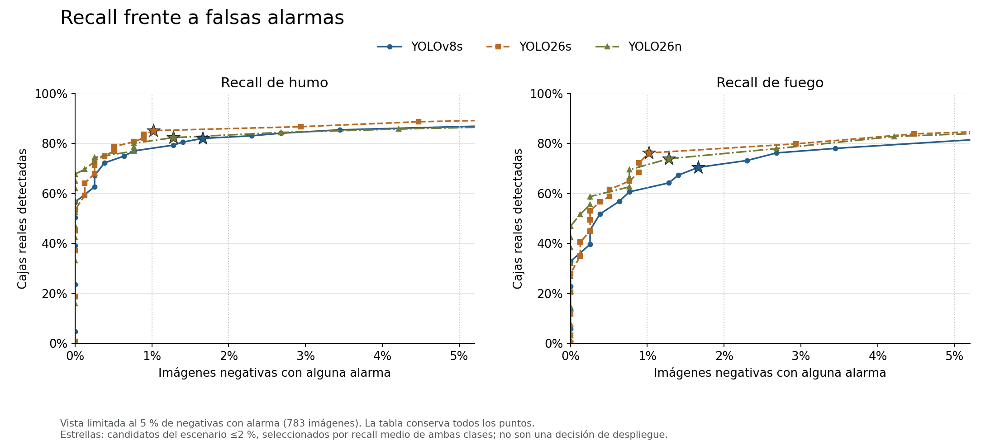

In [8]:
display(Image(filename=str(RESULT_DIR / "figures" / "02_recall_alarm_tradeoff.png"), width=1100))


### 3.4 Detalle por clase en el escenario del 2 %

In [9]:
display(present_table(selected, ["model_key", "threshold", "smoke_precision", "smoke_recall", "smoke_f1", "fire_precision", "fire_recall", "fire_f1"]))


Modelo,Confianza,P humo,Recall humo,F1 humo,P fuego,Recall fuego,F1 fuego
YOLOv8s,0.30,81.3%,82.1%,81.7%,69.2%,70.5%,69.8%
YOLO26s,0.15,73.3%,85.2%,78.8%,56.6%,76.3%,65.0%
YOLO26n,0.15,69.2%,82.4%,75.2%,55.5%,73.9%,63.4%


## 4. Revisión de errores

### 4.1 Tamaño de las cajas

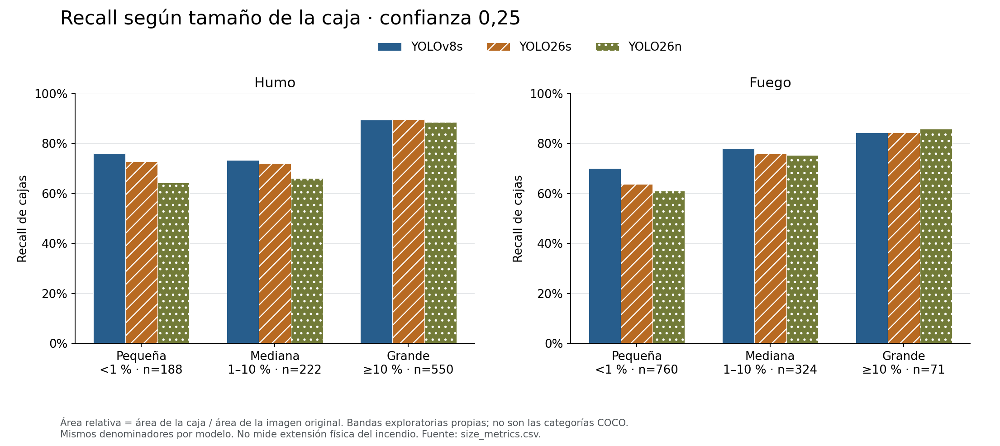

In [10]:
display(Image(filename=str(RESULT_DIR / "figures" / "03_recall_by_size.png"), width=1100))


In [11]:
small = sizes[np.isclose(sizes.threshold, .25) & (sizes.size_band == "small")]
lines = ["Recall de cajas pequeñas (<1 % del área de imagen), con confianza 0,25:"]
for model in summary["config"]["experiments"]:
    row = small[small.model_key == model].set_index("class_name")
    lines.append(f"- {MODEL_LABELS[model]}: humo {row.loc['smoke', 'recall']:.1%} "
                 f"(n={int(row.loc['smoke', 'gt_boxes'])}), fuego {row.loc['fire', 'recall']:.1%} "
                 f"(n={int(row.loc['fire', 'gt_boxes'])}).")
display(Markdown("\n".join(lines)))


Recall de cajas pequeñas (<1 % del área de imagen), con confianza 0,25:
- YOLOv8s: humo 76.1% (n=188), fuego 70.1% (n=760).
- YOLO26s: humo 72.9% (n=188), fuego 63.8% (n=760).
- YOLO26n: humo 64.4% (n=188), fuego 61.1% (n=760).

### 4.2 FN recuperables y persistentes

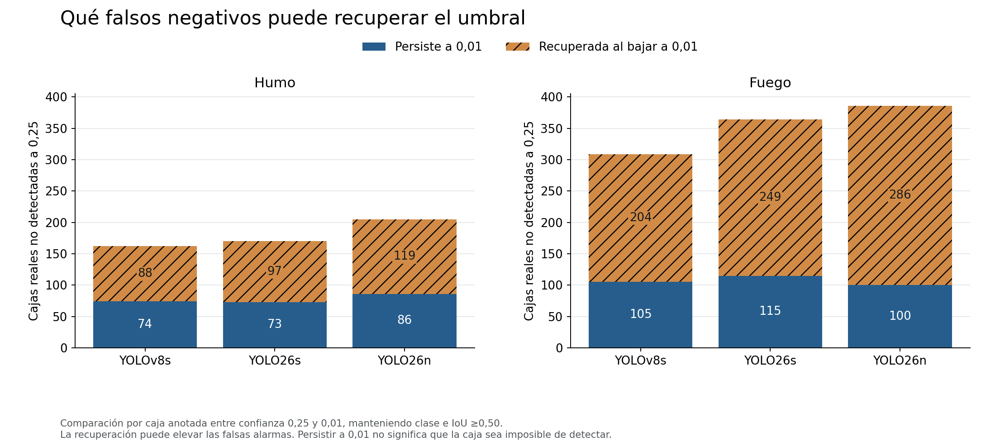

In [12]:
display(Image(filename=str(RESULT_DIR / "figures" / "04_false_negative_diagnosis.png"), width=1100))


**Recuperable** significa que una anotación perdida a 0,25 encuentra una
predicción correcta a 0,01. **Persistente** significa que sigue sin emparejarse al
mínimo evaluado; puede deberse a ausencia de caja, clase o localización. No es un
límite absoluto del modelo. La figura no recomienda usar 0,01: debe leerse junto a las alarmas.

### 4.3 Tipos geométricos de falsos positivos

In [13]:
review_points = selected[["model_key", "threshold"]]
review_predictions = detections.merge(review_points, on=["model_key", "threshold"], validate="many_to_one")
fp_types = review_predictions[review_predictions.status == "fp"].groupby(["model_key", "fp_reason"]).size().unstack(fill_value=0)
fp_types = fp_types.rename(index=MODEL_LABELS, columns={"duplicate": "Duplicada", "wrong_class": "Clase incorrecta",
    "localization": "Localización", "weak_overlap": "Solapamiento débil", "no_overlap": "Sin solapamiento"})
display(fp_types)
print("Clasificación geométrica: no identifica automáticamente nubes, niebla, reflejos ni errores de anotación.")
print("Las predicciones de área cero tras recorte se conservan como FP, para mantener el protocolo histórico.")


fp_reason,Duplicada,Localización,Sin solapamiento,Solapamiento débil,Clase incorrecta
model_key,,,,,
YOLO26n,286,452,272,14,12
YOLO26s,213,429,302,18,12
YOLOv8s,61,291,172,9,11


Clasificación geométrica: no identifica automáticamente nubes, niebla, reflejos ni errores de anotación.
Las predicciones de área cero tras recorte se conservan como FP, para mantener el protocolo histórico.


### 4.4 Galerías y observaciones visuales

Muestra dirigida y reproducible: alarmas negativas con mayor confianza,
FN persistentes de menor área y FN recuperables de menor área. Las galerías ayudan
a formular hipótesis; no permiten estimar la proporción de cada causa visual.

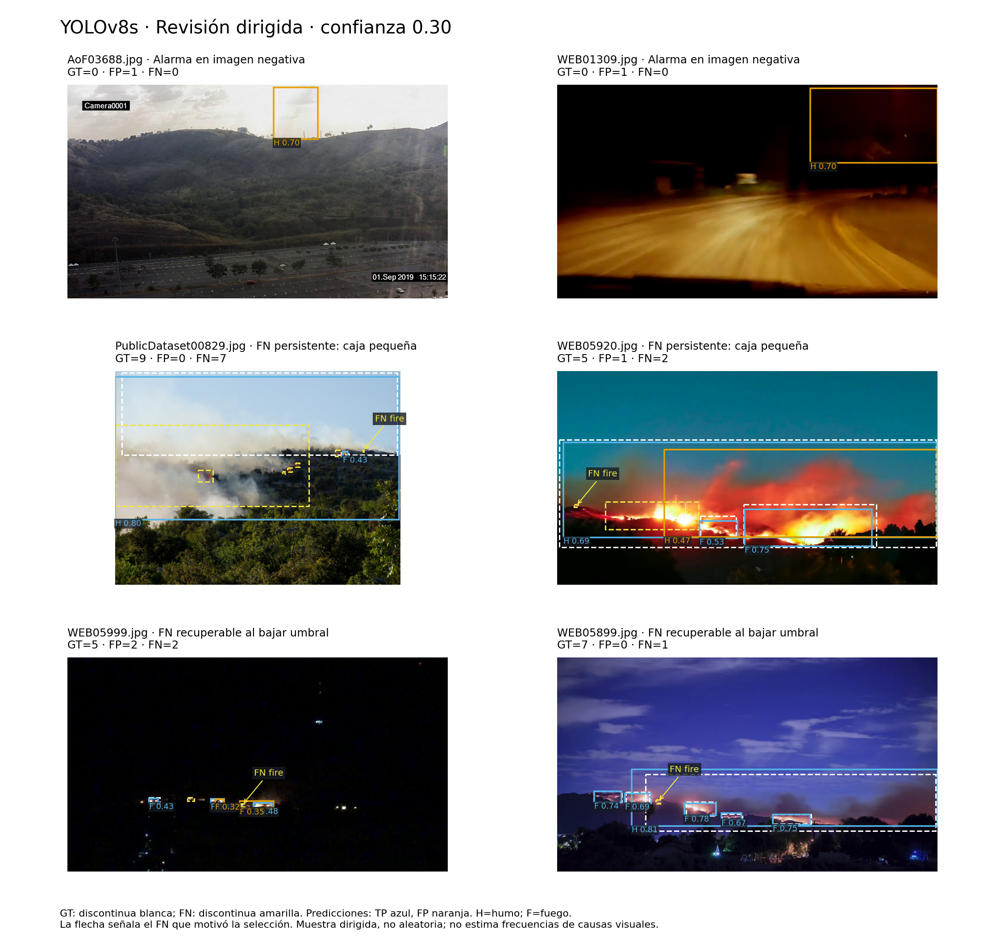

In [14]:
gallery = RESULT_DIR / "review" / "yolov8s_review.png"
if gallery.exists():
    display(Image(filename=str(gallery), width=1100))


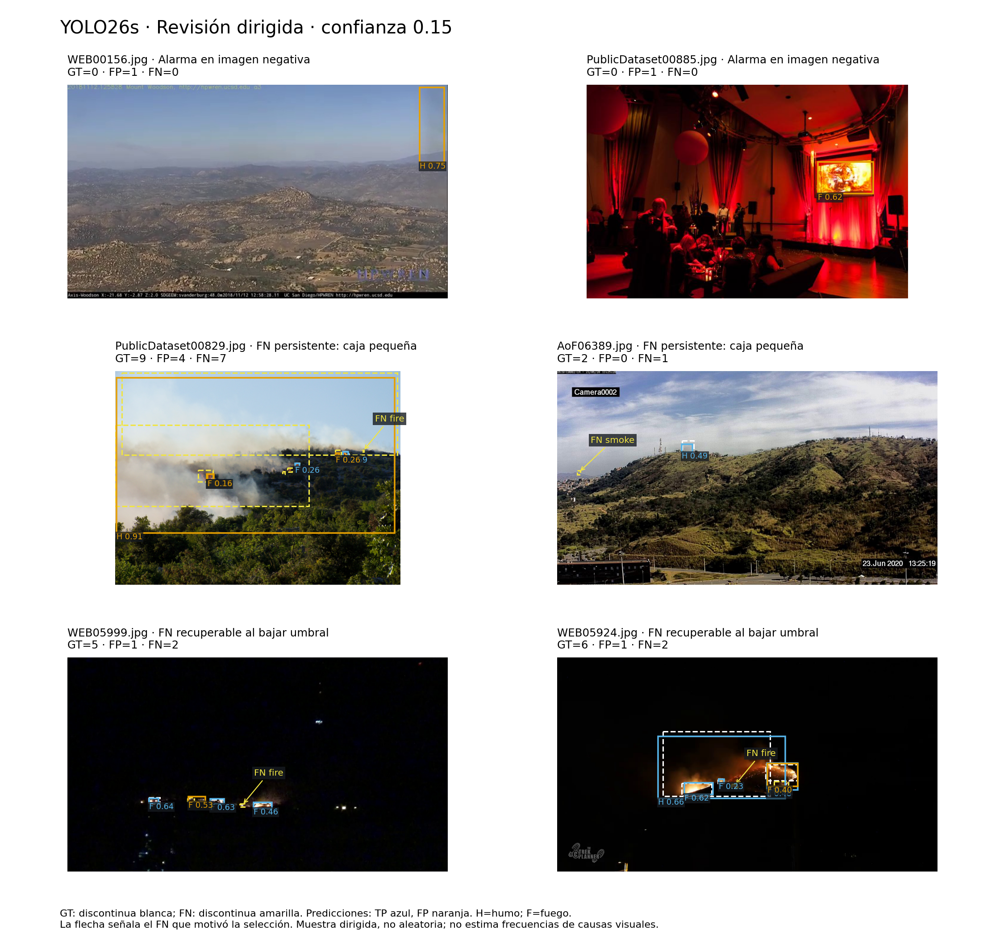

In [15]:
gallery = RESULT_DIR / "review" / "yolo26s_review.png"
if gallery.exists():
    display(Image(filename=str(gallery), width=1100))


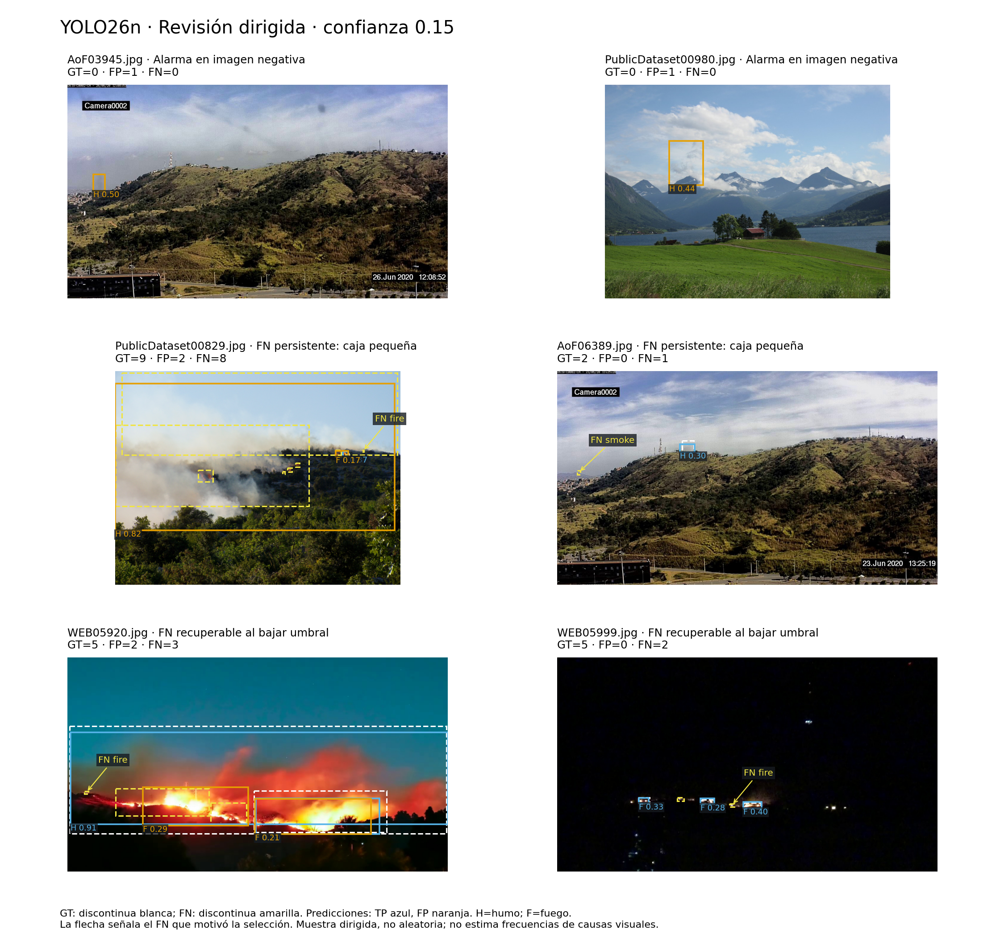

In [16]:
gallery = RESULT_DIR / "review" / "yolo26n_review.png"
if gallery.exists():
    display(Image(filename=str(gallery), width=1100))


In [17]:
visual_path = RESULT_DIR / "visual_review.csv"
if visual_path.exists():
    visual = pd.read_csv(visual_path).fillna("")
    display(visual[["model_key", "filename", "observation", "hypothesis"]].rename(columns={
        "model_key": "Modelo", "filename": "Imagen", "observation": "Observación", "hypothesis": "Hipótesis / siguiente comprobación"}).style
        .set_properties(**{"text-align": "left", "white-space": "normal", "max-width": "340px", "vertical-align": "top"}).hide(axis="index"))
else:
    display(Markdown("La selección automática está guardada. La inspección visual todavía no está registrada."))


Modelo,Imagen,Observación,Hipótesis / siguiente comprobación
yolov8s,AoF03688.jpg,La caja de humo cubre una zona de cielo claro sobre la cresta. La imagen muestra nubes y reflejos; no hay cajas GT.,Posible confusión con cielo o iluminación. Revisar la anotación y fotogramas vecinos antes de atribuir una causa.
yolov8s,WEB01309.jpg,Escena nocturna de carretera desenfocada. La caja de humo cae en una región oscura rojiza de la parte superior derecha; no hay GT.,Baja calidad e iluminación son candidatos explicativos. Esta imagen aislada no permite confirmar si existe humo real.
yolov8s,PublicDataset00829.jpg,Incendio en vegetación con humo extenso y focos de llama muy pequeños. El modelo detecta una región de humo y un foco de fuego; quedan siete cajas sin emparejar.,Revisar tamaño de focos y criterio de separación de las dos regiones de humo. La presencia de una alarma no implica localizar todas las cajas.
yolov8s,WEB05920.jpg,Frente de fuego continuo con focos próximos y humo rojizo. Hay dos FN y una predicción adicional de humo sin coincidencia válida.,La agrupación y localización de regiones puede contribuir además del umbral; revisar IoU por caja antes de atribuirlo a resolución.
yolov8s,WEB05999.jpg,Escena muy oscura con pequeños puntos brillantes en una línea lejana. De cinco cajas GT de fuego quedan dos FN en el escenario revisado.,El detalle escaso y el tamaño reducido motivan una prueba de resolución; el FN seleccionado sí tiene coincidencia a 0.01.
yolov8s,WEB05899.jpg,Frente de fuego lejano al anochecer con varios segmentos anotados y una región amplia de humo. Queda un segmento de fuego sin detectar.,Caso de confianza insuficiente en un tramo pequeño: el emparejamiento se recupera al bajar el umbral.
yolo26s,WEB00156.jpg,Paisaje montañoso con cielo y bruma distante. La caja de humo de alta confianza ocupa una franja estrecha en el borde derecho; no hay GT.,Posible confusión con gradientes del cielo o efecto de borde. La causa no queda confirmada por inspección de una sola imagen.
yolo26s,PublicDataset00885.jpg,Interior de un local con iluminación roja y una pantalla que muestra una imagen de fuego. La caja de fuego coincide con la pantalla; no hay GT.,El detector responde a una representación visual de fuego. Buscar negativos equivalentes en entrenamiento o fuentes externas sin mover esta imagen de val.
yolo26s,PublicDataset00829.jpg,Fuego entre vegetación y humo extenso. La caja predicha de humo abarca una región mayor que las anotadas; aparecen cuatro FP y ocho FN por el protocolo de cajas.,Revisar localización y granularidad de anotación además de los focos pequeños; una detección visual de humo puede fallar el IoU exigido.
yolo26s,AoF06389.jpg,Vista de Camera0002 con dos cajas pequeñas de humo en el horizonte. Se empareja la situada cerca de la antena y queda sin detectar la de la zona urbana izquierda.,Señal distante y de bajo contraste. Verificar anotación y detalle de imagen antes de relacionar el FN únicamente con la resolución.


## 5. Interpretación y siguientes pasos

1. Conservar estos puntos como **referencia operativa** para los siguientes entrenamientos.
2. Separar las mejoras de confianza de las mejoras del detector: los FN persistentes,
   especialmente los pequeños, motivan un experimento controlado de resolución.
3. Revisar los ejemplos concretos antes de atribuir errores a datos o anotaciones.
4. Repetir la comparación en validación para cada nueva configuración y comprobar
   estabilidad con semillas adicionales antes de afirmar que una arquitectura es superior.
5. Congelar pesos, resolución, modo de inferencia y confianza antes de la evaluación final.

**Límites para la memoria:** métricas por caja, alarmas por imagen y escenas relacionadas;
no se han medido aún alarmas por hora ni generalización a vídeo de dron. El baseline
YOLOv8s ya tiene un test histórico; este barrido no lo utiliza para seleccionar candidatos.

### 5.1 Reproducir y localizar las fuentes

In [18]:
print("Configuración ejecutada:", RESULT_DIR / "config.yaml")
print("Resumen y fuentes:", RESULT_DIR / "RESUMEN_BARRIDO.md")
print("Tablas completas:", RESULT_DIR / "threshold_metrics.csv")
print("Escenarios:", RESULT_DIR / "scenario_candidates.csv")
print("Predicciones y versiones: run_summary.json → inputs")
print("Figuras para la memoria: figures/*.svg y figures/*.png")
print("Ejecutar desde la raíz del proyecto:")
print("  python tools/run_threshold_sweep.py              # reutiliza cachés válidas o infiere con GPU")
print("  python tools/run_threshold_sweep.py --offline    # solo cachés existentes")
print("  python -m unittest discover -s tests -p test_tfm_thresholds.py")


Configuración ejecutada: /workspace/TFM/artifacts/05_threshold_sweep/validation/20260911T201435Z_0a767584/config.yaml
Resumen y fuentes: /workspace/TFM/artifacts/05_threshold_sweep/validation/20260911T201435Z_0a767584/RESUMEN_BARRIDO.md
Tablas completas: /workspace/TFM/artifacts/05_threshold_sweep/validation/20260911T201435Z_0a767584/threshold_metrics.csv
Escenarios: /workspace/TFM/artifacts/05_threshold_sweep/validation/20260911T201435Z_0a767584/scenario_candidates.csv
Predicciones y versiones: run_summary.json → inputs
Figuras para la memoria: figures/*.svg y figures/*.png
Ejecutar desde la raíz del proyecto:
  python tools/run_threshold_sweep.py              # reutiliza cachés válidas o infiere con GPU
  python tools/run_threshold_sweep.py --offline    # solo cachés existentes
  python -m unittest discover -s tests -p test_tfm_thresholds.py


Referencias: [Ultralytics Predict](https://docs.ultralytics.com/modes/predict/),
[Ultralytics Val](https://docs.ultralytics.com/modes/val/).
La implementación ejecutada se fija mediante versiones y copias de código en los artefactos.